In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objs as go
from datetime import timedelta

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [14, 8]

import seaborn as sb

1. Preprocesamiento de los datos recopilados de Teledyne en Lima solo se considera a partir del 26 de Noviembre 00:00 hasta el 11 de Enero 15:15 con una frecuencia de 15 minutos.

In [ ]:
df_teledyne = pd.read_csv('PUCP.txt',sep=',')

<ipython-input-2-c78f5e9a8a5c>:1: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  df_teledyne = pd.read_csv('PUCP.txt',sep=',')


In [ ]:
df_teledyne.head()

,Date & Time (Local),Date & Time (UTC),Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 1Hr Avg,PM10 Conc,PM10STP Conc,PM2.5 Conc,PM2.5STP Conc
0,11/22/2023 3:49:00 PM,11/22/2023 8:49:00 PM,98.987503,24.090794,27.600555,28.885246,-----,52.065785,53.129412,15.904316,16.229218
1,11/22/2023 3:50:00 PM,11/22/2023 8:50:00 PM,98.984085,24.096111,27.833282,30.603745,-----,44.125049,45.029815,15.822956,16.147399
2,11/22/2023 3:51:00 PM,11/22/2023 8:51:00 PM,98.986656,24.041195,28.050201,31.663033,-----,41.621195,42.467400,14.547638,14.843408
3,11/22/2023 3:52:00 PM,11/22/2023 8:52:00 PM,98.984848,24.045813,28.267609,32.511742,-----,40.149596,40.971947,13.841840,14.125351
4,11/22/2023 3:53:00 PM,11/22/2023 8:53:00 PM,98.988022,24.064817,28.474854,33.187958,-----,36.202619,36.943052,13.204181,13.474239


In [ ]:
df_teledyne.dtypes

Date & Time (Local)     object
 Date & Time (UTC)      object
 Ambient Pressure      float64
 Ambient Temp          float64
 Box Temp              float64
 LED Temp              float64
 PM10 1Hr Avg           object
 PM10 Conc             float64
 PM10STP Conc          float64
 PM2.5 Conc            float64
 PM2.5STP Conc         float64
dtype: object

In [ ]:
df_teledyne.describe()

,Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 Conc,PM10STP Conc,PM2.5 Conc,PM2.5STP Conc
count,70721.000000,70721.000000,70721.000000,70721.000000,70721.000000,70721.000000,70721.000000,70721.000000
mean,99.072635,21.631071,33.228882,42.851470,29.537657,29.874086,11.877261,12.010824
std,0.176754,1.995487,3.334472,2.542993,10.739552,10.884225,4.068793,4.112054
min,98.621384,18.021399,27.600555,28.885246,9.928064,9.949987,5.180691,5.192537
25%,98.946472,19.940048,30.648712,40.806046,22.903310,23.169276,9.366680,9.466068
50%,99.065559,21.577341,31.728973,42.224930,27.580493,27.915522,10.963370,11.112025
75%,99.190712,22.942554,36.181641,44.723694,33.431951,33.833486,13.197062,13.364062
max,99.637077,27.974396,43.057617,51.603256,310.542437,315.900230,52.345460,53.095981


In [ ]:
df_teledyne['Date & Time (Local)'] = pd.to_datetime(df_teledyne['Date & Time (Local)'])
df_teledyne[' Date & Time (UTC)'] = pd.to_datetime(df_teledyne[' Date & Time (UTC)'])

<ipython-input-6-35dbcc2fe3df>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_teledyne['Date & Time (Local)'] = pd.to_datetime(df_teledyne['Date & Time (Local)'])
<ipython-input-6-35dbcc2fe3df>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_teledyne[' Date & Time (UTC)'] = pd.to_datetime(df_teledyne[' Date & Time (UTC)'])


In [ ]:
df_teledyne.head()

,Date & Time (Local),Date & Time (UTC),Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 1Hr Avg,PM10 Conc,PM10STP Conc,PM2.5 Conc,PM2.5STP Conc
0,2023-11-22 15:49:00,2023-11-22 20:49:00,98.987503,24.090794,27.600555,28.885246,-----,52.065785,53.129412,15.904316,16.229218
1,2023-11-22 15:50:00,2023-11-22 20:50:00,98.984085,24.096111,27.833282,30.603745,-----,44.125049,45.029815,15.822956,16.147399
2,2023-11-22 15:51:00,2023-11-22 20:51:00,98.986656,24.041195,28.050201,31.663033,-----,41.621195,42.467400,14.547638,14.843408
3,2023-11-22 15:52:00,2023-11-22 20:52:00,98.984848,24.045813,28.267609,32.511742,-----,40.149596,40.971947,13.841840,14.125351
4,2023-11-22 15:53:00,2023-11-22 20:53:00,98.988022,24.064817,28.474854,33.187958,-----,36.202619,36.943052,13.204181,13.474239


In [ ]:
df_teledyne_filtered = df_teledyne[df_teledyne['Date & Time (Local)'] >= '2023-11-26']
df_teledyne_filtered.set_index('Date & Time (Local)', inplace=True)

In [ ]:
df_teledyne_filtered = df_teledyne_filtered.drop(' PM10 1Hr Avg',axis=1)
df_teledyne_filtered = df_teledyne_filtered.drop(' Date & Time (UTC)',axis=1)

In [ ]:
df_teledyne_resampled = df_teledyne_filtered.resample('15T').mean()

In [ ]:
df_teledyne_resampled.head()

,Ambient Pressure,Ambient Temp,Box Temp,LED Temp,PM10 Conc,PM10STP Conc,PM2.5 Conc,PM2.5STP Conc
Date & Time (Local),,,,,,,,
2023-11-26 00:00:00,99.084829,18.536724,29.610384,39.424203,19.321754,19.329776,7.636557,7.639751
2023-11-26 00:15:00,99.072753,18.598553,29.681020,39.474114,19.415996,19.430829,8.074571,8.080754
2023-11-26 00:30:00,99.055646,18.578528,29.770756,39.544603,18.102574,18.118166,8.446027,8.453230
2023-11-26 00:45:00,99.028929,18.623791,29.873275,39.613398,24.358141,24.388934,9.241250,9.252902
2023-11-26 01:00:00,99.012363,18.663804,30.022585,39.697945,27.559251,27.605591,11.519737,11.533082


In [ ]:
df_teledyne_resampled.shape

(4478, 8)

In [ ]:
df_teledyne_final = df_teledyne_resampled[[" PM2.5 Conc"," PM10 Conc"]]

In [ ]:
traces = []
trace = go.Scatter(x=df_teledyne_filtered.index, y=df_teledyne_filtered[' PM2.5 Conc'], mode='lines', name='TELEDYNE_ORI')
traces.append(trace)
trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min y original de TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_teledyne_final.to_csv('teledyne_lima.csv')

2. Preprocesamiento de los datos recopilados de IQAir en Lima solo se considera en los siguientes rangos:
*   B9RE1OI40YI: 27 de Noviembre 18:15 hasta el 11 de Enero 16:15
*   MGCBBTFKR4H: 27 de Noviembre 16:30 hasta el 11 de Enero 15:15
*   NFSK8TMXZA6: 27 de Noviembre 18:00 hasta el 11 de Enero 15:15
    
    Además la frecuencia es de 15 minutos.

In [ ]:
df_iqair_iq1 = pd.read_csv('B9RE1OI40YI.csv',sep=';')
df_iqair_iq2 = pd.read_csv('MGCBBTFKR4H.csv',sep=',')
df_iqair_iq3 = pd.read_csv('NFSK8TMXZA6.csv',sep=',')

In [ ]:
df_iqair_iq1.head()
df_iqair_iq2.head()
df_iqair_iq3.head()

,Timezone,Datetime,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),slot2.pm1,slot2.pm10,slot2.pm25,slot4.pm1,slot4.pm10,slot4.pm25
0,America/Lima UTC-05:00,11/01/2024 15:22,37,13,9.0,19.0,5.0,24.5,76.1,80,100422,5,21,10,5.0,17.0,8.0
1,America/Lima UTC-05:00,11/01/2024 15:17,33,11,8.0,14.5,5.5,24.3,75.7,78,100413,5,15,8,6.0,14.0,8.0
2,America/Lima UTC-05:00,11/01/2024 15:12,29,10,7.0,12.0,5.5,25.0,77.0,76,100420,6,12,7,5.0,12.0,7.0
3,America/Lima UTC-05:00,11/01/2024 15:07,33,11,8.0,14.0,5.0,25.9,78.6,71,100421,5,17,9,5.0,11.0,7.0
4,America/Lima UTC-05:00,11/01/2024 15:02,31,11,7.5,13.0,5.0,24.8,76.6,76,100427,5,15,8,5.0,11.0,7.0


In [ ]:
df_iqair_iq1.dtypes
df_iqair_iq2.dtypes
df_iqair_iq3.dtypes

Timezone                     object
Datetime                     object
AQI US                        int64
AQI CN                        int64
PM2.5 (ug/m3)               float64
PM10 (ug/m3)                float64
PM1 (ug/m3)                 float64
Temperature (Celsius)       float64
Temperature (Fahrenheit)    float64
Humidity (%)                  int64
Pressure (pascal)             int64
slot2.pm1                     int64
slot2.pm10                    int64
slot2.pm25                    int64
slot4.pm1                   float64
slot4.pm10                  float64
slot4.pm25                  float64
dtype: object

In [ ]:
df_iqair_iq1.describe()
df_iqair_iq2.describe()
df_iqair_iq3.describe()

,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),slot2.pm1,slot2.pm10,slot2.pm25,slot4.pm1,slot4.pm10,slot4.pm25
count,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,12907.000000,6701.000000,6701.000000,6701.000000
mean,49.717750,18.846982,13.198884,22.403115,9.360347,20.626459,69.127915,84.864957,100422.017820,9.533277,23.180290,13.590455,10.059991,22.190569,13.603343
std,16.229064,8.793016,6.209549,10.322964,4.560028,2.659502,4.787288,9.774561,179.697021,4.970909,12.481766,7.153284,5.002982,10.406956,6.430590
min,14.000000,5.000000,3.500000,6.500000,2.500000,16.200000,61.200000,55.000000,99965.000000,2.000000,5.000000,3.000000,3.000000,6.000000,4.000000
25%,39.000000,14.000000,9.500000,16.000000,6.500000,18.500000,65.300000,77.000000,100294.000000,6.000000,15.000000,9.000000,6.000000,15.000000,9.000000
50%,48.000000,16.000000,11.500000,20.000000,8.000000,20.000000,68.000000,88.000000,100419.000000,8.000000,20.000000,12.000000,9.000000,20.000000,12.000000
75%,57.000000,21.000000,15.000000,25.500000,10.500000,22.500000,72.500000,92.000000,100543.000000,10.000000,27.000000,15.000000,12.000000,27.000000,16.000000
max,154.000000,82.000000,60.500000,102.000000,48.000000,29.500000,85.100000,100.000000,100893.000000,46.000000,129.000000,65.000000,42.000000,90.000000,54.000000


In [ ]:
df_iqair_iq1['Datetime'] = pd.to_datetime(df_iqair_iq1['Datetime'],format="%d/%m/%Y %H:%M")
df_iqair_iq2['Datetime'] = pd.to_datetime(df_iqair_iq2['Datetime'],format="%d/%m/%Y %H:%M")
df_iqair_iq3['Datetime'] = pd.to_datetime(df_iqair_iq3['Datetime'],format="%d/%m/%Y %H:%M")

In [ ]:
df_iqair_iq1.head()
df_iqair_iq2.head()
df_iqair_iq3.head()

,Timezone,Datetime,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),slot2.pm1,slot2.pm10,slot2.pm25,slot4.pm1,slot4.pm10,slot4.pm25
0,America/Lima UTC-05:00,2024-01-11 15:22:00,37,13,9.0,19.0,5.0,24.5,76.1,80,100422,5,21,10,5.0,17.0,8.0
1,America/Lima UTC-05:00,2024-01-11 15:17:00,33,11,8.0,14.5,5.5,24.3,75.7,78,100413,5,15,8,6.0,14.0,8.0
2,America/Lima UTC-05:00,2024-01-11 15:12:00,29,10,7.0,12.0,5.5,25.0,77.0,76,100420,6,12,7,5.0,12.0,7.0
3,America/Lima UTC-05:00,2024-01-11 15:07:00,33,11,8.0,14.0,5.0,25.9,78.6,71,100421,5,17,9,5.0,11.0,7.0
4,America/Lima UTC-05:00,2024-01-11 15:02:00,31,11,7.5,13.0,5.0,24.8,76.6,76,100427,5,15,8,5.0,11.0,7.0


In [ ]:
df_iqair_filtered_iq1 = df_iqair_iq1[df_iqair_iq1['Datetime'] >= '2023-11-26']
df_iqair_filtered_iq1.set_index('Datetime', inplace=True)
df_iqair_filtered_iq2 = df_iqair_iq2[df_iqair_iq2['Datetime'] >= '2023-11-26']
df_iqair_filtered_iq2.set_index('Datetime', inplace=True)
df_iqair_filtered_iq3 = df_iqair_iq3[df_iqair_iq3['Datetime'] >= '2023-11-26']
df_iqair_filtered_iq3.set_index('Datetime', inplace=True)

In [ ]:
df_iqair_filtered_iq1 = df_iqair_filtered_iq1.drop('Timezone',axis=1)
df_iqair_filtered_iq2 = df_iqair_filtered_iq2.drop('Timezone',axis=1)
df_iqair_filtered_iq3 = df_iqair_filtered_iq3.drop('Timezone',axis=1)

In [ ]:
df_iqair_resampled_iq1 = df_iqair_filtered_iq1.resample('15T').mean()
df_iqair_resampled_iq2 = df_iqair_filtered_iq2.resample('15T').mean()
df_iqair_resampled_iq3 = df_iqair_filtered_iq3.resample('15T').mean()

In [ ]:
df_iqair_resampled_iq1["Pressure (hPa)"] = df_iqair_resampled_iq1["Pressure (pascal)"] / 100
df_iqair_resampled_iq2["Pressure (hPa)"] = df_iqair_resampled_iq2["Pressure (pascal)"] / 100
df_iqair_resampled_iq3["Pressure (hPa)"] = df_iqair_resampled_iq3["Pressure (pascal)"] / 100

In [ ]:
df_iqair_resampled_iq1.tail()
df_iqair_resampled_iq2.tail()
df_iqair_resampled_iq3.tail()

,AQI US,AQI CN,PM2.5 (ug/m3),PM10 (ug/m3),PM1 (ug/m3),Temperature (Celsius),Temperature (Fahrenheit),Humidity (%),Pressure (pascal),slot2.pm1,slot2.pm10,slot2.pm25,slot4.pm1,slot4.pm10,slot4.pm25,Pressure (hPa)
Datetime,,,,,,,,,,,,,,,,
2024-01-11 14:15:00,31.000000,10.666667,7.500000,14.000000,4.833333,27.000000,80.600000,67.333333,100444.000000,4.666667,14.666667,7.666667,5.000000,13.333333,7.333333,1004.440000
2024-01-11 14:30:00,28.333333,10.000000,6.833333,11.666667,4.833333,25.700000,78.233333,71.333333,100437.000000,5.000000,12.333333,7.000000,4.666667,11.000000,6.666667,1004.370000
2024-01-11 14:45:00,31.000000,10.333333,7.500000,14.333333,5.166667,24.866667,76.733333,75.000000,100433.666667,5.666667,15.333333,8.000000,4.666667,13.333333,7.000000,1004.336667
2024-01-11 15:00:00,31.000000,10.666667,7.500000,13.000000,5.166667,25.233333,77.400000,74.333333,100422.666667,5.333333,14.666667,8.000000,5.000000,11.333333,7.000000,1004.226667
2024-01-11 15:15:00,35.000000,12.000000,8.500000,16.750000,5.250000,24.400000,75.900000,79.000000,100417.500000,5.000000,18.000000,9.000000,5.500000,15.500000,8.000000,1004.175000


In [ ]:
df_iqair_final_iq1 = df_iqair_resampled_iq1[["PM2.5 (ug/m3)","PM10 (ug/m3)","Temperature (Celsius)","Temperature (Fahrenheit)","Humidity (%)","Pressure (hPa)"]]
df_iqair_final_iq2 = df_iqair_resampled_iq2[["PM2.5 (ug/m3)","PM10 (ug/m3)","Temperature (Celsius)","Temperature (Fahrenheit)","Humidity (%)","Pressure (hPa)"]]
df_iqair_final_iq3 = df_iqair_resampled_iq3[["PM2.5 (ug/m3)","PM10 (ug/m3)","Temperature (Celsius)","Temperature (Fahrenheit)","Humidity (%)","Pressure (hPa)"]]

In [ ]:
traces = []

trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['PM2.5 (ug/m3)'], mode='lines', name='IQ1_RES')
traces.append(trace)
#trace = go.Scatter(x=df_iqair_filtered_iq1.index, y=df_iqair_filtered_iq1['PM2.5 (ug/m3)'], mode='lines', name='IQ1_ORI')
#traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['PM2.5 (ug/m3)'], mode='lines', name='IQ2_RES')
traces.append(trace)
#trace = go.Scatter(x=df_iqair_filtered_iq2.index, y=df_iqair_filtered_iq2['PM2.5 (ug/m3)'], mode='lines', name='IQ2_ORI')
#traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['PM2.5 (ug/m3)'], mode='lines', name='IQ3_RES')
traces.append(trace)
#trace = go.Scatter(x=df_iqair_filtered_iq3.index, y=df_iqair_filtered_iq3['PM2.5 (ug/m3)'], mode='lines', name='IQ3_ORI')
#traces.append(trace)
#trace = go.Scatter(x=df_teledyne_filtered.index, y=df_teledyne_filtered[' PM2.5 Conc'], mode='lines', name='TELEDYNE_ORI')
#traces.append(trace)

layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min de los IAQir y TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['Temperature (Fahrenheit)'], mode='lines', name='IQ1_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['Temperature (Fahrenheit)'], mode='lines', name='IQ2_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['Temperature (Fahrenheit)'], mode='lines', name='IQ3_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los IAQir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['Humidity (%)'], mode='lines', name='IQ1_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['Humidity (%)'], mode='lines', name='IQ2_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['Humidity (%)'], mode='lines', name='IQ3_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los IAQir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_iqair_final_iq1.index, y=df_iqair_final_iq1['Pressure (hPa)'], mode='lines', name='IQ1_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq2.index, y=df_iqair_final_iq2['Pressure (hPa)'], mode='lines', name='IQ2_RES')
traces.append(trace)
trace = go.Scatter(x=df_iqair_final_iq3.index, y=df_iqair_final_iq3['Pressure (hPa)'], mode='lines', name='IQ3_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Presión en hPa agrupado cada 15 min de los IAQir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de presión en hPa'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_iqair_final_iq1.to_csv('iqair_NFSK8TMXZA6_lima.csv')
df_iqair_final_iq2.to_csv('iqair_MGCBBTFKR4H_lima.csv')
df_iqair_final_iq3.to_csv('iqair_B9RE1OI40YI_lima.csv')

3. Preprocesamiento de los datos recopilados de Qhawax en Lima solo se considera en los siguientes rangos:
*   qH013: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH014: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH015: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH017: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
*   qH018: 27 de Noviembre 18:30 hasta el 11 de Enero 15:15
    
    Además la frecuencia es de 15 minutos.

In [ ]:
df_qhawax_q1 = pd.read_csv('qH013.csv',sep=';')
df_qhawax_q2 = pd.read_csv('qH014.csv',sep=';')
df_qhawax_q3 = pd.read_csv('qH015.csv',sep=';')
df_qhawax_q4 = pd.read_csv('qH017.csv',sep=';')
df_qhawax_q5 = pd.read_csv('qH018.csv',sep=';')

In [ ]:
df_qhawax_q1.head()
df_qhawax_q2.head()
df_qhawax_q3.head()
df_qhawax_q4.head()
df_qhawax_q5.head()

,Temperatura Interna (C),PM10 (ug/m3),PM2.5 (ug/m3),Humedad (%),Presion (hPa),Ruido (dB),Temperatura (C),Fecha
0,22.4,84.508,32.225,82.5,1003.656,91.8,20.0,27/11/2023 18:41
1,22.4,71.953,32.373,82.5,1003.644,83.8,20.0,27/11/2023 18:41
2,22.4,61.631,32.791,82.5,1003.639,86.2,20.0,27/11/2023 18:41
3,22.4,60.090,32.730,82.7,1003.652,79.9,20.0,27/11/2023 18:41
4,22.4,63.016,31.548,82.7,1003.656,89.4,20.0,27/11/2023 18:42


In [ ]:
df_qhawax_q1.dtypes
df_qhawax_q2.dtypes
df_qhawax_q3.dtypes
df_qhawax_q4.dtypes
df_qhawax_q5.dtypes

Temperatura Interna (C)    float64
PM10 (ug/m3)               float64
PM2.5 (ug/m3)              float64
Humedad (%)                float64
Presion (hPa)              float64
Ruido (dB)                 float64
Temperatura (C)            float64
Fecha                       object
dtype: object

In [ ]:
df_qhawax_q1.describe()
df_qhawax_q2.describe()
df_qhawax_q3.describe()
df_qhawax_q4.describe()
df_qhawax_q5.describe()

,Temperatura Interna (C),PM10 (ug/m3),PM2.5 (ug/m3),Humedad (%),Presion (hPa),Ruido (dB),Temperatura (C)
count,177166.000000,177166.000000,177166.000000,177166.000000,177166.000000,177166.000000,177166.00000
mean,26.826259,74.446656,33.038980,80.743265,1003.977064,73.648532,22.66952
std,4.447963,33.614616,15.618336,12.096618,1.813225,13.345706,2.90404
min,20.700000,11.075000,8.534000,46.000000,999.303000,42.700000,17.70000
25%,23.400000,50.404000,23.197000,70.400000,1002.701000,64.000000,20.50000
50%,25.100000,67.640500,29.310500,84.700000,1003.944000,72.600000,22.00000
75%,30.500000,91.444750,38.383000,90.600000,1005.167000,82.300000,24.80000
max,39.700000,431.203000,185.373000,100.000000,1008.741000,118.500000,32.00000


In [ ]:
df_qhawax_q1['Fecha'] = pd.to_datetime(df_qhawax_q1['Fecha'],format="%d/%m/%Y %H:%M")
df_qhawax_q2['Fecha'] = pd.to_datetime(df_qhawax_q2['Fecha'],format="%d/%m/%Y %H:%M")
df_qhawax_q3['Fecha'] = pd.to_datetime(df_qhawax_q3['Fecha'],format="%d/%m/%Y %H:%M")
df_qhawax_q4['Fecha'] = pd.to_datetime(df_qhawax_q4['Fecha'],format="%d/%m/%Y %H:%M")
df_qhawax_q5['Fecha'] = pd.to_datetime(df_qhawax_q5['Fecha'],format="%d/%m/%Y %H:%M")

In [ ]:
df_qhawax_filtered_q1 = df_qhawax_q1[df_qhawax_q1['Fecha'] >= '2023-11-26']
df_qhawax_filtered_q1.set_index('Fecha', inplace=True)
df_qhawax_filtered_q2 = df_qhawax_q2[df_qhawax_q2['Fecha'] >= '2023-11-26']
df_qhawax_filtered_q2.set_index('Fecha', inplace=True)
df_qhawax_filtered_q3 = df_qhawax_q3[df_qhawax_q3['Fecha'] >= '2023-11-26']
df_qhawax_filtered_q3.set_index('Fecha', inplace=True)
df_qhawax_filtered_q4 = df_qhawax_q4[df_qhawax_q4['Fecha'] >= '2023-11-26']
df_qhawax_filtered_q4.set_index('Fecha', inplace=True)
df_qhawax_filtered_q5 = df_qhawax_q5[df_qhawax_q5['Fecha'] >= '2023-11-26']
df_qhawax_filtered_q5.set_index('Fecha', inplace=True)

In [ ]:
df_qhawax_resampled_q1 = df_qhawax_filtered_q1.resample('15T').mean()
df_qhawax_resampled_q2 = df_qhawax_filtered_q2.resample('15T').mean()
df_qhawax_resampled_q3 = df_qhawax_filtered_q3.resample('15T').mean()
df_qhawax_resampled_q4 = df_qhawax_filtered_q4.resample('15T').mean()
df_qhawax_resampled_q5 = df_qhawax_filtered_q5.resample('15T').mean()

In [ ]:
df_qhawax_resampled_q1.tail()
df_qhawax_resampled_q2.tail()
df_qhawax_resampled_q3.tail()
df_qhawax_resampled_q4.tail()
df_qhawax_resampled_q5.tail()

,Temperatura Interna (C),PM10 (ug/m3),PM2.5 (ug/m3),Humedad (%),Presion (hPa),Ruido (dB),Temperatura (C)
Fecha,,,,,,,
2024-01-11 14:15:00,36.100000,66.520333,29.836133,60.228889,1004.241422,86.553333,29.315556
2024-01-11 14:30:00,35.320000,56.959667,28.429733,63.833333,1004.129822,93.855556,28.024444
2024-01-11 14:45:00,34.173333,61.172911,28.049667,67.055556,1004.085867,95.026667,27.164444
2024-01-11 15:00:00,33.795556,70.185533,31.872156,66.742222,1003.979933,87.348889,27.588889
2024-01-11 15:15:00,33.100000,66.532000,32.385300,71.790000,1003.910700,91.920000,26.380000


In [ ]:
df_qhawax_final_q1 = df_qhawax_resampled_q1.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q2 = df_qhawax_resampled_q2.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q3 = df_qhawax_resampled_q3.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q4 = df_qhawax_resampled_q4.drop('Temperatura Interna (C)',axis=1)
df_qhawax_final_q5 = df_qhawax_resampled_q5.drop('Temperatura Interna (C)',axis=1)

In [ ]:
df_qhawax_resampled_q1["Temperatura (F)"] = (df_qhawax_resampled_q1["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q2["Temperatura (F)"] = (df_qhawax_resampled_q2["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q3["Temperatura (F)"] = (df_qhawax_resampled_q3["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q4["Temperatura (F)"] = (df_qhawax_resampled_q4["Temperatura (C)"]*9/5)+32
df_qhawax_resampled_q5["Temperatura (F)"] = (df_qhawax_resampled_q5["Temperatura (C)"]*9/5)+32

In [ ]:
df_qhawax_final_q1 = df_qhawax_resampled_q1.drop('Temperatura (C)',axis=1)
df_qhawax_final_q2 = df_qhawax_resampled_q2.drop('Temperatura (C)',axis=1)
df_qhawax_final_q3 = df_qhawax_resampled_q3.drop('Temperatura (C)',axis=1)
df_qhawax_final_q4 = df_qhawax_resampled_q4.drop('Temperatura (C)',axis=1)
df_qhawax_final_q5 = df_qhawax_resampled_q5.drop('Temperatura (C)',axis=1)

In [ ]:
traces = []

trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['PM2.5 (ug/m3)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['PM2.5 (ug/m3)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['PM2.5 (ug/m3)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['PM2.5 (ug/m3)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['PM2.5 (ug/m3)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min de los Qhawax y TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Temperatura (F)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Temperatura (F)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Temperatura (F)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Temperatura (F)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Temperatura (F)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Humedad (%)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Humedad (%)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Humedad (%)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Humedad (%)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Humedad (%)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_qhawax_final_q1.index, y=df_qhawax_final_q1['Presion (hPa)'], mode='lines', name='Q1_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q2.index, y=df_qhawax_final_q2['Presion (hPa)'], mode='lines', name='Q2_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q3.index, y=df_qhawax_final_q3['Presion (hPa)'], mode='lines', name='Q3_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q4.index, y=df_qhawax_final_q4['Presion (hPa)'], mode='lines', name='Q4_RES')
traces.append(trace)
trace = go.Scatter(x=df_qhawax_final_q5.index, y=df_qhawax_final_q5['Presion (hPa)'], mode='lines', name='Q5_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Presión en hPa agrupado cada 15 min de los Qhawax',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Presión en hPa'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_qhawax_final_q1.to_csv('qH013_lima.csv')
df_qhawax_final_q2.to_csv('qH014_lima.csv')
df_qhawax_final_q3.to_csv('qH015_lima.csv')
df_qhawax_final_q4.to_csv('qH017_lima.csv')
df_qhawax_final_q5.to_csv('qH018_lima.csv')

In [ ]:
df_qhawax_final_q1

,Temperatura Interna (C),PM10 (ug/m3),PM2.5 (ug/m3),Humedad (%),Presion (hPa),Ruido (dB),Temperatura (F)
Fecha,,,,,,,
2023-11-27 18:30:00,22.556098,65.079024,27.806634,82.595122,1002.963220,NaN,68.144878
2023-11-27 18:45:00,22.861364,64.164114,25.894136,81.852273,1003.092341,NaN,68.323182
2023-11-27 19:00:00,22.900000,62.196758,26.571182,81.745455,1003.245879,NaN,68.272727
2023-11-27 19:15:00,22.816667,55.134417,24.791167,82.450000,1003.377667,NaN,67.960000
2023-11-27 19:30:00,22.730769,58.369103,24.648923,82.241026,1003.531590,NaN,67.912308
...,...,...,...,...,...,...,...
2024-01-11 14:15:00,35.597778,45.002511,21.262689,72.337778,1003.515178,NaN,80.368000
2024-01-11 14:30:00,34.846667,43.903844,20.879067,75.871111,1003.447444,NaN,78.664000
2024-01-11 14:45:00,33.815556,42.104222,21.617733,78.864444,1003.406244,NaN,77.704000


4. Preprocesamiento de los datos recopilados de PurpleAir en Lima solo se considera en los siguientes rangos:
*   80CF: 27 de Noviembre 20:30 hasta el 11 de Enero 20:15
*   8540: 27 de Noviembre 20:30 hasta el 11 de Enero 20:15
*   B746: 27 de Noviembre 20:30 hasta el 11 de Enero 20:15
*   F78D: 27 de Noviembre 20:30 hasta el 11 de Enero 15:15

    Además la frecuencia es de 15 minutos.

In [ ]:
df_purple_p1 = pd.read_csv('80CF.csv',sep=',')
df_purple_p2 = pd.read_csv('8540.csv',sep=',')
df_purple_p3 = pd.read_csv('B746.csv',sep=',')
df_purple_p4 = pd.read_csv('F78D.csv',sep=';')

In [ ]:
df_purple_p1.head()
df_purple_p2.head()
df_purple_p3.head()
df_purple_p4.head()

,UTCDateTime,current_temp_f,current_humidity,current_dewpoint_f,pressure,adc,mem,rssi,uptime,pm1_0_cf_1,...,pm10_0_atm_b,pm2.5_aqi_cf_1_b,pm2.5_aqi_atm_b,p_0_3_um_b,p_0_5_um_b,p_1_0_um_b,p_2_5_um_b,p_5_0_um_b,p_10_0_um_b,gas
0,2023/06/16T18:27:36z,74,33,43,868.67,0.04,18192,-63,358,1.22,...,2.28,8,8,381.16,106.49,16.67,1.04,0.23,0.23,NaN
1,2023/06/16T18:29:36z,73,33,42,868.66,0.04,18192,-63,478,0.95,...,1.65,7,7,290.18,80.69,14.73,2.49,0.00,0,NaN
2,2023/06/16T18:31:36z,73,33,42,868.69,0.04,18192,-59,598,1.19,...,1.69,7,7,352.07,94.81,13.64,1.34,0.00,0,NaN
3,2023/06/16T18:33:36z,73,33,42,868.58,0.04,18192,-62,718,1.53,...,1.37,5,5,343.42,89.30,13.18,0.35,0.05,0.05,NaN
4,2023/06/16T18:35:36z,73,33,42,868.61,0.04,18192,-58,838,1.33,...,2.56,10,10,387.84,109.42,21.75,1.74,0.18,0.18,NaN


In [ ]:
df_purple_p1.dtypes
df_purple_p2.dtypes
df_purple_p3.dtypes
df_purple_p4.dtypes

UTCDateTime            object
current_temp_f          int64
current_humidity        int64
current_dewpoint_f      int64
pressure              float64
adc                   float64
mem                     int64
rssi                    int64
uptime                  int64
pm1_0_cf_1            float64
pm2_5_cf_1            float64
pm10_0_cf_1           float64
pm1_0_atm             float64
pm2_5_atm             float64
pm10_0_atm            float64
pm2.5_aqi_cf_1          int64
pm2.5_aqi_atm           int64
p_0_3_um              float64
p_0_5_um              float64
p_1_0_um              float64
p_2_5_um              float64
p_5_0_um              float64
p_10_0_um             float64
pm1_0_cf_1_b          float64
pm2_5_cf_1_b          float64
pm10_0_cf_1_b         float64
pm1_0_atm_b           float64
pm2_5_atm_b           float64
pm10_0_atm_b          float64
pm2.5_aqi_cf_1_b        int64
pm2.5_aqi_atm_b         int64
p_0_3_um_b            float64
p_0_5_um_b            float64
p_1_0_um_b

In [ ]:
df_purple_p1 = df_purple_p1[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]
df_purple_p2 = df_purple_p2[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]
df_purple_p3 = df_purple_p3[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]
df_purple_p4 = df_purple_p4[["UTCDateTime","current_temp_f","current_humidity","pressure","pm2_5_atm","pm10_0_atm"]]

In [ ]:
df_purple_p1.describe()
df_purple_p2.describe()
df_purple_p3.describe()
df_purple_p4.describe()

,current_temp_f,current_humidity,pressure,pm2_5_atm,pm10_0_atm
count,32384.000000,32384.000000,32384.000000,32384.000000,32384.000000
mean,76.712698,57.885406,1004.913040,13.478289,14.371954
std,5.679760,9.051592,5.155498,6.027916,6.781137
min,68.000000,27.000000,854.570000,1.740000,1.740000
25%,72.000000,51.000000,1003.820000,9.570000,10.140000
50%,75.000000,61.000000,1005.040000,11.960000,12.660000
75%,80.000000,65.000000,1006.280000,15.400000,16.270000
max,94.000000,73.000000,1009.790000,97.460000,103.280000


In [ ]:
df_purple_p1['UTCDateTime'] = pd.to_datetime(df_purple_p1['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p1['UTCDateTime'] = pd.to_datetime(df_purple_p1['UTCDateTime'],format="%d/%m/%Y %H:%M")
df_purple_p2['UTCDateTime'] = pd.to_datetime(df_purple_p2['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p2['UTCDateTime'] = pd.to_datetime(df_purple_p2['UTCDateTime'],format="%d/%m/%Y %H:%M")
df_purple_p3['UTCDateTime'] = pd.to_datetime(df_purple_p3['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p3['UTCDateTime'] = pd.to_datetime(df_purple_p3['UTCDateTime'],format="%d/%m/%Y %H:%M")
df_purple_p4['UTCDateTime'] = pd.to_datetime(df_purple_p4['UTCDateTime']).dt.strftime("%d/%m/%Y %H:%M")
df_purple_p4['UTCDateTime'] = pd.to_datetime(df_purple_p4['UTCDateTime'],format="%d/%m/%Y %H:%M")

In [ ]:
df_purple_p1['UTCDateTime'] = df_purple_p1['UTCDateTime'] - pd.Timedelta(hours=5)
df_purple_p2['UTCDateTime'] = df_purple_p2['UTCDateTime'] - pd.Timedelta(hours=5)
df_purple_p3['UTCDateTime'] = df_purple_p3['UTCDateTime'] - pd.Timedelta(hours=5)
df_purple_p4['UTCDateTime'] = df_purple_p4['UTCDateTime'] - pd.Timedelta(hours=5)

In [ ]:
df_purple_p1.head()
df_purple_p2.head()
df_purple_p3.head()
df_purple_p4.head()

,UTCDateTime,current_temp_f,current_humidity,pressure,pm2_5_atm,pm10_0_atm
0,2023-06-16 13:27:00,74,33,868.67,2.36,2.36
1,2023-06-16 13:29:00,73,33,868.66,2.03,2.22
2,2023-06-16 13:31:00,73,33,868.69,2.02,2.02
3,2023-06-16 13:33:00,73,33,868.58,2.67,3.04
4,2023-06-16 13:35:00,73,33,868.61,2.74,3.05


In [ ]:
df_purple_filtered_prev = df_purple_p1[df_purple_p1['UTCDateTime'] >= '2023-11-26']
df_purple_filtered_p1 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-01-12']
df_purple_filtered_p1.set_index('UTCDateTime', inplace=True)
df_purple_filtered_prev = df_purple_p2[df_purple_p2['UTCDateTime'] >= '2023-11-26']
df_purple_filtered_p2 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-01-12']
df_purple_filtered_p2.set_index('UTCDateTime', inplace=True)
df_purple_filtered_prev = df_purple_p3[df_purple_p3['UTCDateTime'] >= '2023-11-26']
df_purple_filtered_p3 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-01-12']
df_purple_filtered_p3.set_index('UTCDateTime', inplace=True)
df_purple_filtered_prev = df_purple_p4[df_purple_p4['UTCDateTime'] >= '2023-11-26']
df_purple_filtered_p4 = df_purple_filtered_prev[df_purple_filtered_prev['UTCDateTime'] < '2024-01-12']
df_purple_filtered_p4.set_index('UTCDateTime', inplace=True)

In [ ]:
df_purple_resampled_p1 = df_purple_filtered_p1.resample('15T').mean()
df_purple_resampled_p2 = df_purple_filtered_p2.resample('15T').mean()
df_purple_resampled_p3 = df_purple_filtered_p3.resample('15T').mean()
df_purple_resampled_p4 = df_purple_filtered_p4.resample('15T').mean()

In [ ]:
df_purple_resampled_p1.tail()
df_purple_resampled_p2.tail()
df_purple_resampled_p3.tail()
df_purple_resampled_p4.tail()

,current_temp_f,current_humidity,pressure,pm2_5_atm,pm10_0_atm
UTCDateTime,,,,,
2024-01-11 14:15:00,90.750000,40.750000,1005.355000,7.372500,7.842500
2024-01-11 14:30:00,89.000000,42.000000,1005.274286,6.148571,6.592857
2024-01-11 14:45:00,87.000000,44.625000,1005.173750,7.351250,7.982500
2024-01-11 15:00:00,86.714286,46.000000,1005.048571,8.145714,8.741429
2024-01-11 15:15:00,84.714286,49.714286,1005.060000,7.518571,8.135714


:

In [ ]:
traces = []

trace = go.Scatter(x=df_teledyne_final.index, y=df_teledyne_final[' PM2.5 Conc'], mode='lines', name='TELEDYNE_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p1.index, y=df_purple_resampled_p1['pm2_5_atm'], mode='lines', name='P1_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['pm2_5_atm'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['pm2_5_atm'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['pm2_5_atm'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de PM2.5 agrupado cada 15 min de los PurpleAir y TELEDYNE',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de PM2.5'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_purple_resampled_p1.index, y=df_purple_resampled_p1['current_temp_f'], mode='lines', name='P1_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['current_temp_f'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['current_temp_f'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['current_temp_f'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Temperatura en F agrupado cada 15 min de los PurpleAir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Temperatura en F'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_purple_resampled_p1.index, y=df_purple_resampled_p1['current_humidity'], mode='lines', name='P1_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['current_humidity'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['current_humidity'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['current_humidity'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Humedad en % agrupado cada 15 min de los PurpleAir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Humedad en %'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
traces = []

trace = go.Scatter(x=df_purple_resampled_p1.index, y=df_purple_resampled_p1['pressure'], mode='lines', name='P1_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p2.index, y=df_purple_resampled_p2['pressure'], mode='lines', name='P2_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p3.index, y=df_purple_resampled_p3['pressure'], mode='lines', name='P3_RES')
traces.append(trace)
trace = go.Scatter(x=df_purple_resampled_p4.index, y=df_purple_resampled_p4['pressure'], mode='lines', name='P4_RES')
traces.append(trace)

layout = go.Layout(title='Medición de Presión en hPa agrupado cada 15 min de los PurpleAir',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de medición de Presión en hPa'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [ ]:
df_purple_resampled_p1.to_csv('purple_80CF_lima.csv')
df_purple_resampled_p2.to_csv('purple_8540_lima.csv')
df_purple_resampled_p3.to_csv('purple_B746_lima.csv')
df_purple_resampled_p4.to_csv('purple_F78D_lima.csv')

4. Preprocesamiento de los datos de tráfico

In [ ]:
df_flow = pd.read_csv('consolidado_flow.csv',sep=',')

FileNotFoundError: [Errno 2] No such file or directory: 'consolidado_flow.csv'

In [ ]:
df_flow.head()

In [ ]:
df_flow.dtypes

In [ ]:
df_flow.describe()

In [ ]:
df_flow['sourceUpdated'] = pd.to_datetime(df_flow['sourceUpdated']).dt.strftime("%d/%m/%Y %H:%M")
df_flow['sourceUpdated'] = pd.to_datetime(df_flow['sourceUpdated'],format="%d/%m/%Y %H:%M")

In [ ]:
df_flow['sourceUpdated'] = df_flow['sourceUpdated'] - pd.Timedelta(hours=5)

In [ ]:
df_flow.head()

In [ ]:
df_flow_filtered_prev = df_flow[df_flow['sourceUpdated'] >= '2023-11-26']
df_flow_filtered = df_flow_filtered_prev[df_flow_filtered_prev['sourceUpdated'] < '2024-01-12']
df_flow_filtered.set_index('sourceUpdated', inplace=True)

In [ ]:
df_flow_filtered = df_flow_filtered[["Jam Factor"]]

In [ ]:
df_flow_resampled = df_flow_filtered.resample('15T').mean()

In [ ]:
traces = []
trace = go.Scatter(x=df_flow_resampled.index, y=df_flow_resampled['Jam Factor'], mode='lines', name='flow_RES')
traces.append(trace)
layout = go.Layout(title='Medición de flow',
                   xaxis=dict(title='Fecha'),
                   yaxis=dict(title='Valor de congestión'))
fig = go.Figure(data=traces, layout=layout)
fig.show()

5. Generando dataset para el entrenamiento de los modelos

Para Lima se tomará los datos desde el 27 de Noviembre a las 20:30 hasta el 11 de Enero a las 15:15

5.1 Teledyne

In [ ]:
fecha_inicio = '2023-11-27 20:30:00'
fecha_fin = '2024-01-11 15:15:00'

In [ ]:
df_teledyne_analizar = df_teledyne_final.loc[fecha_inicio:fecha_fin]

In [ ]:
df_teledyne_analizar.isna().sum()

 PM2.5 Conc    4
 PM10 Conc     4
dtype: int64

In [ ]:
indices_nulos_t = df_teledyne_analizar.index[df_teledyne_analizar[' PM2.5 Conc'].isnull()]
indices_nulos_t

DatetimeIndex(['2023-12-26 10:30:00', '2023-12-26 10:45:00',
               '2023-12-26 11:00:00', '2023-12-26 11:15:00'],
              dtype='datetime64[ns]', name='Date & Time (Local)', freq='15T')

In [ ]:
df_teledyne_analizar = df_teledyne_analizar.drop(indices_nulos_t)

In [ ]:
def registrosConsecutivos(fechas_dt):
  segmentos = []
  segmento_actual = [fechas_dt[0]]

  for i in range(1, len(fechas_dt)):
      if fechas_dt[i] - fechas_dt[i - 1] == timedelta(minutes=15):
          segmento_actual.append(fechas_dt[i])
      else:
          # Guardar el segmento actual si tiene al menos 4 fechas consecutivas.
          if len(segmento_actual) >= 4:
              for fecha in segmento_actual:
                segmentos.append(fecha)
          segmento_actual = [fechas_dt[i]]

  # No olvidar el último segmento.
  if len(segmento_actual) >= 4:
      for fecha in segmento_actual:
        segmentos.append(fecha)
  return segmentos
  # Mostrar los segmentos que tienen al menos 1 hora de fechas consecutivas.
  #for segmento in segmentos:
  #    print("Segmento:")
  #    for fecha in segmento:
  #        print(fecha.strftime("%Y-%m-%d %H:%M"))

5.2.0 IQs

In [ ]:
df_iqair_analizar_iq1 = df_iqair_final_iq1.loc[fecha_inicio:fecha_fin]
df_iqair_analizar_iq2 = df_iqair_final_iq2.loc[fecha_inicio:fecha_fin]
df_iqair_analizar_iq3 = df_iqair_final_iq3.loc[fecha_inicio:fecha_fin]

In [ ]:
df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_nulos_t)
df_iqair_analizar_iq2 = df_iqair_analizar_iq2.drop(indices_nulos_t)
df_iqair_analizar_iq3 = df_iqair_analizar_iq3.drop(indices_nulos_t)

In [ ]:
def quitar_nulos(df_iqair_analizar_iq1):
  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['PM2.5 (ug/m3)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Temperature (Fahrenheit)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Humidity (%)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Pressure (hPa)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  return df_iqair_analizar_iq1

In [ ]:
def armar_dataset(df_iqair_interp_iq1):
  PM25_15min_iq1 = pd.DataFrame()
  PM25_15min_iq1['Teledyne_pm2.5'] = df_teledyne_analizar.loc[df_iqair_interp_iq1.index,' PM2.5 Conc']
  PM25_15min_iq1['Pm2.5'] = df_iqair_interp_iq1['PM2.5 (ug/m3)']
  PM25_15min_iq1['Temp'] = df_iqair_interp_iq1['Temperature (Celsius)']
  PM25_15min_iq1['Humedad'] = df_iqair_interp_iq1['Humidity (%)']
  PM25_15min_iq1['Presion'] = df_iqair_interp_iq1['Pressure (hPa)']

  return PM25_15min_iq1

5.2.1 IQ1

In [ ]:
df_iqair_analizar_iq1.isna().sum()

In [ ]:
df_iqair_analizar_iq1 = quitar_nulos(df_iqair_analizar_iq1)

In [ ]:
df_iqair_analizar_iq1.isna().sum()

In [ ]:
df_iqair_interp_iq1 = df_iqair_analizar_iq1.interpolate(method='linear')

In [ ]:
df_iqair_interp_iq1.isna().sum()

In [ ]:
PM25_15min_iq1 = armar_dataset(df_iqair_interp_iq1)

In [ ]:
PM25_15min_iq1

In [ ]:
PM25_15min_iq1.to_csv('iq1_final.csv')

5.1.2 IQ2

In [ ]:
df_iqair_analizar_iq2.isna().sum()

In [ ]:
df_iqair_analizar_iq2 = quitar_nulos(df_iqair_analizar_iq2)

In [ ]:
df_iqair_analizar_iq2.isna().sum()

In [ ]:
df_iqair_interp_iq2 = df_iqair_analizar_iq2.interpolate(method='linear')

In [ ]:
df_iqair_interp_iq2.isna().sum()

In [ ]:
PM25_15min_iq2 = armar_dataset(df_iqair_interp_iq2)

In [ ]:
PM25_15min_iq2

In [ ]:
PM25_15min_iq2.to_csv('iq2_final.csv')

5.2.3 IQ3

In [ ]:
df_iqair_analizar_iq3.isna().sum()

In [ ]:
df_iqair_analizar_iq3 = quitar_nulos(df_iqair_analizar_iq3)

In [ ]:
df_iqair_analizar_iq3.isna().sum()

In [ ]:
df_iqair_interp_iq3 = df_iqair_analizar_iq3.interpolate(method='linear')

In [ ]:
df_iqair_interp_iq3.isna().sum()

In [ ]:
PM25_15min_iq3 = armar_dataset(df_iqair_interp_iq3)

In [ ]:
PM25_15min_iq3

In [ ]:
PM25_15min_iq3.to_csv('iq3_final.csv')

5.3.0 PurplesAir's

In [ ]:
df_purpleair_analizar_p1 = df_purple_resampled_p1.loc[fecha_inicio:fecha_fin]
df_purpleair_analizar_p2 = df_purple_resampled_p2.loc[fecha_inicio:fecha_fin]
df_purpleair_analizar_p3 = df_purple_resampled_p3.loc[fecha_inicio:fecha_fin]
df_purpleair_analizar_p4 = df_purple_resampled_p4.loc[fecha_inicio:fecha_fin]

In [ ]:
df_purpleair_analizar_p1 = df_purpleair_analizar_p1.drop(indices_nulos_t)
df_purpleair_analizar_p2 = df_purpleair_analizar_p2.drop(indices_nulos_t)
df_purpleair_analizar_p3 = df_purpleair_analizar_p3.drop(indices_nulos_t)
df_purpleair_analizar_p4 = df_purpleair_analizar_p4.drop(indices_nulos_t)

In [ ]:
def quitar_nulos(df_iqair_analizar_iq1):
  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['pm2_5_atm'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['current_temp_f'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['current_humidity'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['pressure'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  return df_iqair_analizar_iq1

In [ ]:
def armar_dataset(df_iqair_interp_iq1):
  PM25_15min_iq1 = pd.DataFrame()
  PM25_15min_iq1['Teledyne_pm2.5'] = df_teledyne_analizar.loc[df_iqair_interp_iq1.index,' PM2.5 Conc']
  PM25_15min_iq1['Pm2.5'] = df_iqair_interp_iq1['pm2_5_atm']
  PM25_15min_iq1['Temp'] = df_iqair_interp_iq1['current_temp_f']
  PM25_15min_iq1['Humedad'] = df_iqair_interp_iq1['current_humidity']
  PM25_15min_iq1['Presion'] = df_iqair_interp_iq1['pressure']

  return PM25_15min_iq1

5.3.1 PA1

In [ ]:
df_purpleair_analizar_p1.isna().sum()

In [ ]:
df_purpleair_analizar_p1 = quitar_nulos(df_purpleair_analizar_p1)

In [ ]:
df_purpleair_analizar_p1.isna().sum()

In [ ]:
df_purpleair_interp_p1 = df_purpleair_analizar_p1.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p1.isna().sum()

In [ ]:
PM25_15min_p1 = armar_dataset(df_purpleair_interp_p1)

In [ ]:
PM25_15min_p1

In [ ]:
PM25_15min_p1.to_csv('p1_final.csv')

5.3.2 PA2

In [ ]:
df_purpleair_analizar_p2.isna().sum()

In [ ]:
df_purpleair_analizar_p2 = quitar_nulos(df_purpleair_analizar_p2)

In [ ]:
df_purpleair_analizar_p2.isna().sum()

In [ ]:
df_purpleair_interp_p2 = df_purpleair_analizar_p2.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p2.isna().sum()

In [ ]:
PM25_15min_p2 = armar_dataset(df_purpleair_interp_p2)

In [ ]:
PM25_15min_p2

In [ ]:
PM25_15min_p2.to_csv('p2_final.csv')

5.3.3 PA3

In [ ]:
df_purpleair_analizar_p3.isna().sum()

In [ ]:
df_purpleair_analizar_p3 = quitar_nulos(df_purpleair_analizar_p3)

In [ ]:
df_purpleair_analizar_p3.isna().sum()

In [ ]:
df_purpleair_interp_p3 = df_purpleair_analizar_p3.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p3.isna().sum()

In [ ]:
PM25_15min_p3 = armar_dataset(df_purpleair_interp_p3)

In [ ]:
PM25_15min_p3

In [ ]:
PM25_15min_p3.to_csv('p3_final.csv')

5.3.4 PA4

In [ ]:
df_purpleair_analizar_p4.isna().sum()

In [ ]:
df_purpleair_analizar_p4 = quitar_nulos(df_purpleair_analizar_p4)

In [ ]:
df_purpleair_analizar_p4.isna().sum()

In [ ]:
df_purpleair_interp_p4 = df_purpleair_analizar_p4.interpolate(method='linear')

In [ ]:
df_purpleair_interp_p4.isna().sum()

In [ ]:
PM25_15min_p4 = armar_dataset(df_purpleair_interp_p4)

In [ ]:
PM25_15min_p4

In [ ]:
PM25_15min_p4.to_csv('p4_final.csv')

5.4.0 Qhawax's

In [ ]:
df_qhawax_analizar_q1 = df_qhawax_final_q1.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q2 = df_qhawax_final_q2.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q3 = df_qhawax_final_q3.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q4 = df_qhawax_final_q4.loc[fecha_inicio:fecha_fin]
df_qhawax_analizar_q5 = df_qhawax_final_q5.loc[fecha_inicio:fecha_fin]

In [ ]:
df_qhawax_analizar_q1 = df_qhawax_analizar_q1.drop(indices_nulos_t)
df_qhawax_analizar_q2 = df_qhawax_analizar_q2.drop(indices_nulos_t)
df_qhawax_analizar_q3 = df_qhawax_analizar_q3.drop(indices_nulos_t)
df_qhawax_analizar_q4 = df_qhawax_analizar_q4.drop(indices_nulos_t)
df_qhawax_analizar_q5 = df_qhawax_analizar_q5.drop(indices_nulos_t)

In [ ]:
def quitar_nulos(df_iqair_analizar_iq1):
  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['PM2.5 (ug/m3)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Temperatura (F)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Humedad (%)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  indices_nulos = df_iqair_analizar_iq1.index[df_iqair_analizar_iq1['Presion (hPa)'].isnull()]
  if len(indices_nulos) >= 4:
    indices_quitar = registrosConsecutivos(indices_nulos)
    df_iqair_analizar_iq1 = df_iqair_analizar_iq1.drop(indices_quitar)

  return df_iqair_analizar_iq1

In [ ]:
def armar_dataset(df_iqair_interp_iq1):
  PM25_15min_iq1 = pd.DataFrame()
  PM25_15min_iq1['Teledyne_pm2.5'] = df_teledyne_analizar.loc[df_iqair_interp_iq1.index,' PM2.5 Conc']
  PM25_15min_iq1['Pm2.5'] = df_iqair_interp_iq1['PM2.5 (ug/m3)']
  PM25_15min_iq1['Temp'] = df_iqair_interp_iq1['Temperatura (F)']
  PM25_15min_iq1['Humedad'] = df_iqair_interp_iq1['Humedad (%)']
  PM25_15min_iq1['Presion'] = df_iqair_interp_iq1['Presion (hPa)']

  return PM25_15min_iq1

5.4.1 Q1

In [ ]:
df_qhawax_analizar_q1.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4296
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_analizar_q1 = quitar_nulos(df_qhawax_analizar_q1)

In [ ]:
df_qhawax_analizar_q1.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4296
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q1 = df_qhawax_analizar_q1.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q1.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4296
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q1 = armar_dataset(df_qhawax_interp_q1)

In [ ]:
PM25_15min_q1

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2023-11-27 20:30:00,7.822424,23.388953,67.497674,83.169767,1004.508140
2023-11-27 20:45:00,8.932030,25.640089,67.768000,82.920000,1004.699711
2023-11-27 21:00:00,8.135844,22.865548,67.652857,83.176190,1004.886857
2023-11-27 21:15:00,8.205025,23.537636,67.650909,83.269697,1005.025000
2023-11-27 21:30:00,8.059472,23.821000,67.484545,83.554545,1005.074091
...,...,...,...,...,...
2024-01-11 14:15:00,13.072581,21.262689,80.368000,72.337778,1003.515178
2024-01-11 14:30:00,12.677239,20.879067,78.664000,75.871111,1003.447444
2024-01-11 14:45:00,12.464212,21.617733,77.704000,78.864444,1003.406244


In [ ]:
PM25_15min_q1.to_csv('q1_final.csv')

5.4.2 Q2

In [ ]:
df_qhawax_analizar_q2.isna().sum()

Temperatura Interna (C)       7
PM10 (ug/m3)                  7
PM2.5 (ug/m3)                 7
Humedad (%)                   7
Presion (hPa)                 7
Ruido (dB)                 4296
Temperatura (F)               7
dtype: int64

In [ ]:
df_qhawax_analizar_q2 = quitar_nulos(df_qhawax_analizar_q2)

In [ ]:
df_qhawax_analizar_q2.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4289
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q2 = df_qhawax_analizar_q2.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q2.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4289
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q2 = armar_dataset(df_qhawax_interp_q2)

In [ ]:
PM25_15min_q2

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2023-11-27 20:30:00,7.822424,27.571932,67.496818,81.877273,1004.715864
2023-11-27 20:45:00,8.932030,28.634044,67.632000,81.917778,1004.917511
2023-11-27 21:00:00,8.135844,27.736571,67.640000,82.045238,1005.065667
2023-11-27 21:15:00,8.205025,27.363857,67.609143,82.222857,1005.214914
2023-11-27 21:30:00,8.059472,27.453111,67.456000,82.535556,1005.289578
...,...,...,...,...,...
2024-01-11 14:15:00,13.072581,22.647978,86.388000,55.222222,1003.784711
2024-01-11 14:30:00,12.677239,21.450333,83.920000,58.833333,1003.700978
2024-01-11 14:45:00,12.464212,22.700029,81.997647,62.679412,1003.645824


In [ ]:
PM25_15min_q2.to_csv('q2_final.csv')

5.4.3 Q3

In [ ]:
df_qhawax_analizar_q3.isna().sum()

Temperatura Interna (C)       7
PM10 (ug/m3)                  7
PM2.5 (ug/m3)                 7
Humedad (%)                   7
Presion (hPa)                 7
Ruido (dB)                 4296
Temperatura (F)               7
dtype: int64

In [ ]:
df_qhawax_analizar_q3 = quitar_nulos(df_qhawax_analizar_q3)

In [ ]:
df_qhawax_analizar_q3.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4289
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q3 = df_qhawax_analizar_q3.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q3.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4289
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q3 = armar_dataset(df_qhawax_interp_q3)

In [ ]:
PM25_15min_q3

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2023-11-27 20:30:00,7.822424,27.571932,67.496818,81.877273,1004.715864
2023-11-27 20:45:00,8.932030,28.634044,67.632000,81.917778,1004.917511
2023-11-27 21:00:00,8.135844,27.736571,67.640000,82.045238,1005.065667
2023-11-27 21:15:00,8.205025,27.363857,67.609143,82.222857,1005.214914
2023-11-27 21:30:00,8.059472,27.453111,67.456000,82.535556,1005.289578
...,...,...,...,...,...
2024-01-11 14:15:00,13.072581,22.647978,86.388000,55.222222,1003.784711
2024-01-11 14:30:00,12.677239,21.450333,83.920000,58.833333,1003.700978
2024-01-11 14:45:00,12.464212,22.700029,81.997647,62.679412,1003.645824


In [ ]:
PM25_15min_q3.to_csv('q3_final.csv')

5.4.4 Q4

In [ ]:
df_qhawax_analizar_q4.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4296
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_analizar_q4 = quitar_nulos(df_qhawax_analizar_q4)

In [ ]:
df_qhawax_analizar_q4.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4296
Temperatura (F)               0
dtype: int64

In [ ]:
df_qhawax_interp_q4 = df_qhawax_analizar_q4.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q4.isna().sum()

Temperatura Interna (C)       0
PM10 (ug/m3)                  0
PM2.5 (ug/m3)                 0
Humedad (%)                   0
Presion (hPa)                 0
Ruido (dB)                 4296
Temperatura (F)               0
dtype: int64

In [ ]:
PM25_15min_q4 = armar_dataset(df_qhawax_interp_q4)

In [ ]:
PM25_15min_q4

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2023-11-27 20:30:00,7.822424,12.263250,67.488636,83.411364,1004.490545
2023-11-27 20:45:00,8.932030,12.410533,67.636000,83.466667,1004.687289
2023-11-27 21:00:00,8.135844,12.078778,67.628000,83.682222,1004.854311
2023-11-27 21:15:00,8.205025,12.219667,67.620000,83.750000,1005.020722
2023-11-27 21:30:00,8.059472,12.422156,67.460000,84.006667,1005.075244
...,...,...,...,...,...
2024-01-11 14:15:00,13.072581,13.034273,83.365455,62.986364,1003.753659
2024-01-11 14:30:00,12.677239,12.241267,81.348000,66.344444,1003.668311
2024-01-11 14:45:00,12.464212,13.128467,79.724000,70.122222,1003.625578


In [ ]:
PM25_15min_q4.to_csv('q4_final.csv')

5.4.5 Q5

In [ ]:
df_qhawax_analizar_q5.isna().sum()

Temperatura Interna (C)    4
PM10 (ug/m3)               4
PM2.5 (ug/m3)              4
Humedad (%)                4
Presion (hPa)              4
Ruido (dB)                 4
Temperatura (F)            4
dtype: int64

In [ ]:
df_qhawax_analizar_q5 = quitar_nulos(df_qhawax_analizar_q5)

In [ ]:
df_qhawax_analizar_q5.isna().sum()

Temperatura Interna (C)    0
PM10 (ug/m3)               0
PM2.5 (ug/m3)              0
Humedad (%)                0
Presion (hPa)              0
Ruido (dB)                 0
Temperatura (F)            0
dtype: int64

In [ ]:
df_qhawax_interp_q5 = df_qhawax_analizar_q5.interpolate(method='linear')

In [ ]:
df_qhawax_interp_q5.isna().sum()

Temperatura Interna (C)    0
PM10 (ug/m3)               0
PM2.5 (ug/m3)              0
Humedad (%)                0
Presion (hPa)              0
Ruido (dB)                 0
Temperatura (F)            0
dtype: int64

In [ ]:
PM25_15min_q5 = armar_dataset(df_qhawax_interp_q5)

In [ ]:
PM25_15min_q5

,Teledyne_pm2.5,Pm2.5,Temp,Humedad,Presion
Fecha,,,,,
2023-11-27 20:30:00,7.822424,28.029070,67.296744,83.355814,1005.097744
2023-11-27 20:45:00,8.932030,28.976455,67.517273,83.150000,1005.299273
2023-11-27 21:00:00,8.135844,27.102045,67.443636,83.365909,1005.453523
2023-11-27 21:15:00,8.205025,27.275645,67.448387,83.506452,1005.591516
2023-11-27 21:30:00,8.059472,25.929311,67.280000,83.760000,1005.666400
...,...,...,...,...,...
2024-01-11 14:15:00,13.072581,29.836133,84.768000,60.228889,1004.241422
2024-01-11 14:30:00,12.677239,28.429733,82.444000,63.833333,1004.129822
2024-01-11 14:45:00,12.464212,28.049667,80.896000,67.055556,1004.085867


In [ ]:
PM25_15min_q5.to_csv('q5_final.csv')

5.2.4 Analítica de los datos

In [ ]:
PM25_15min_iq1 = pd.read_csv('iq1_final_a.csv',sep=',')
PM25_15min_iq2 = pd.read_csv('iq2_final_a.csv',sep=',')
PM25_15min_iq3 = pd.read_csv('iq3_final_a.csv',sep=',')

In [ ]:
PM25_15min_iq3.shape

(3540, 6)

In [ ]:
PM25_15min = pd.DataFrame()
PM25_15min['Teledyne_pm2.5'] = PM25_15min_iq1['Teledyne_pm2.5']
PM25_15min['IQ1_pm2.5'] = PM25_15min_iq1['Pm2.5']
PM25_15min['IQ2_pm2.5'] = PM25_15min_iq2['Pm2.5']
PM25_15min['IQ3_pm2.5'] = PM25_15min_iq3['Pm2.5']

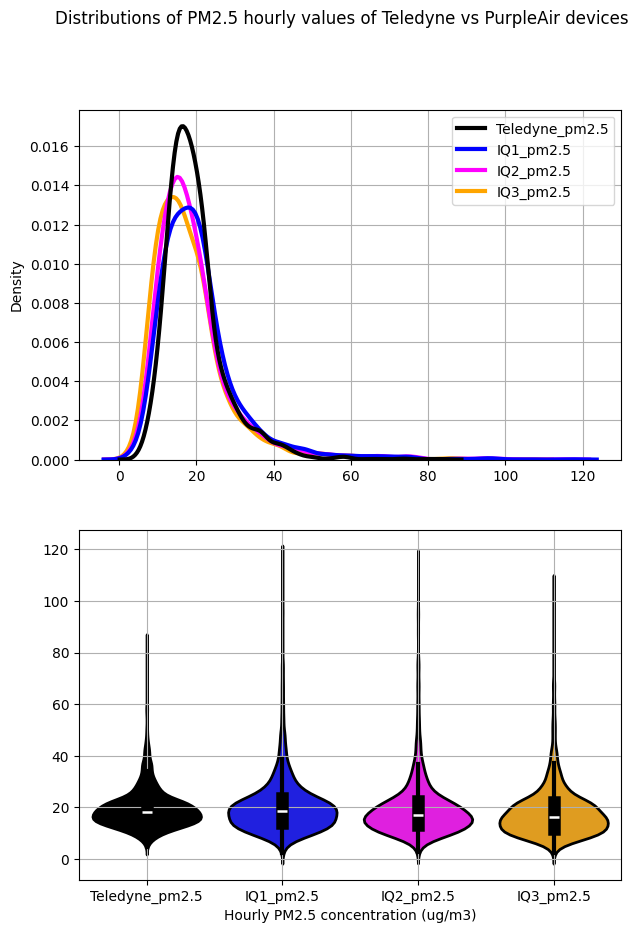

In [ ]:
# genera una figura con 2 subplots
#
fig, axes = plt.subplots(2, 1, figsize=(7, 10), sharex=False)
# Genera kdeplot
sb.kdeplot(ax=axes[0], data=PM25_15min, linewidth=3, palette={'Teledyne_pm2.5': 'black', 'IQ1_pm2.5':'blue', 'IQ2_pm2.5':'magenta', 'IQ3_pm2.5':'orange', 'IQ3_pm2.5':'orange'}  )
axes[0].grid()
# genera boxplot
sb.violinplot(ax=axes[1], data=PM25_15min, linewidth=2, orient = "v", palette={'Teledyne_pm2.5': 'black', 'IQ1_pm2.5':'blue', 'IQ2_pm2.5':'magenta', 'IQ3_pm2.5':'orange'} )
fig.suptitle('Distributions of PM2.5 hourly values of Teledyne vs PurpleAir devices')
axes[1].grid()
plt.xlabel('Hourly PM2.5 concentration (ug/m3)')
plt.show()   #Figure BB#